In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install ydata-profiling


In [4]:
!pip install pydantic-settings

In [14]:
import pandas as pd
from ydata_profiling import ProfileReport

train_path = '/content/drive/MyDrive/Projects Data/Devices Price Classification System/train - train.csv'
test_path = '/content/drive/MyDrive/Projects Data/Devices Price Classification System/test - test.csv'

df_train = pd.read_csv(train_path)
df_test = pd.read_csv(test_path)


profile = ProfileReport(df_train, title='Pandas Profiling Report', explorative=True)

profile.to_file('pandas_profiling_report.html')

profile.to_notebook_iframe()


/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# **Data Preparing Section:**






**Note 1:**For get information about the data, **ydata-profiling** was used to profiling data.


---


**Note 2:** in 'pc' and 'fc' columns, if the value is 0, this means that there is no camera, so we don't deal with this as a zeros value problem.


---




In Correlation section in ***ProfileReport***
we can notice:



1. There is a strong correlation between 'fc' and 'pc', in same time we can notice that the value of correlation between 'fc' and the target varible 'price_range' is 0.00.
**Solution:**
 so we can delete this feature('fc').  


2. There is a strong correlation between 'three_g' and 'four_g', in the same time there is no correlation between ''three_g' and 'price_range' .
Even with other variables, it's correlation weak overall.
**Solution:**
 the best choice is to delete it.


3. For 'sc_w' column, around 9% of the values are zeros. This column has a moderate correlation with 'sc_h'.
**Solution:**
 building a model to estimate his zeros values based on 'sc_h'.

4. There is a moderate correlation between
'px_width' and 'px_height', in the same time 'px_height' have a week correlation with all features including target feature 'price_range'.
**Solution:**
delet 'px_height' is a good solution for the model.

---

*The snippet of code below shows the correlation matrix, and you can see it also from the profile report in section (Correlation).



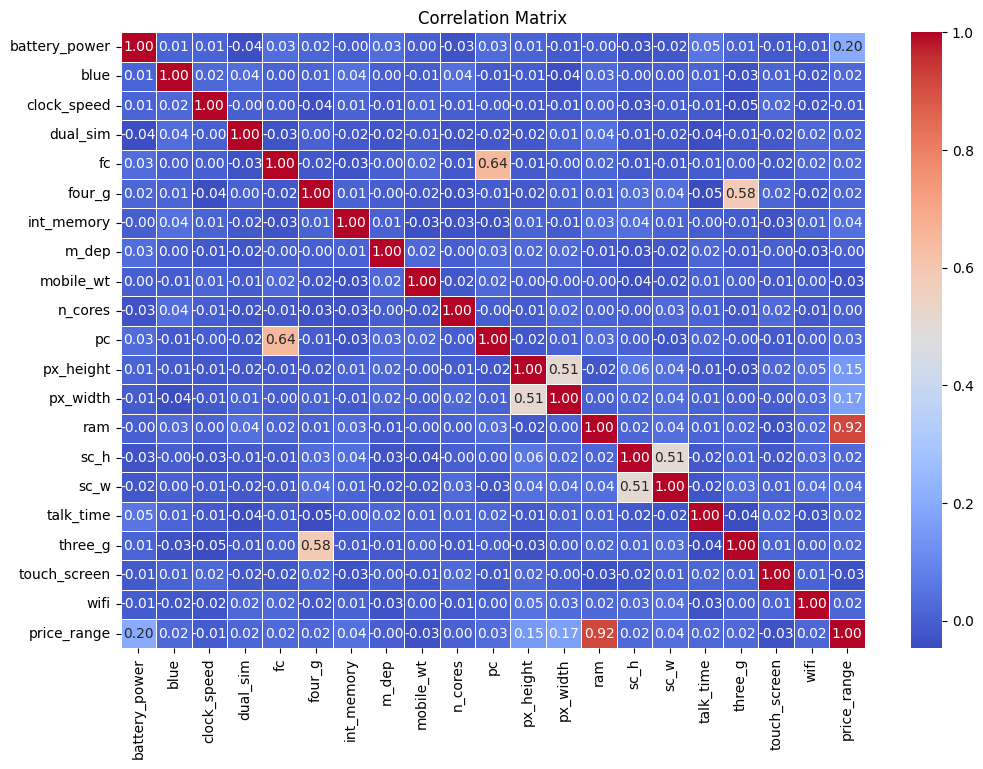

Strong correlations (|corr| >= 0.7):
price_range and ram: 0.92
ram and price_range: 0.92

Moderate correlations (|corr| >= 0.3):
pc and fc: 0.64
three_g and four_g: 0.58
fc and pc: 0.64
px_width and px_height: 0.51
px_height and px_width: 0.51
sc_w and sc_h: 0.51
sc_h and sc_w: 0.51
four_g and three_g: 0.58


In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Compute the correlation matrix
corr_matrix = df_train.corr()

# Display the correlation matrix using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

#Define thresholds for strong and moderate correlations
thresholds = {
    'strong': 0.7,
    'moderate': 0.3
}

#Extract strong and moderate correlations
strong_correlations = []
moderate_correlations = []

for column in corr_matrix.columns:
    for index in corr_matrix.index:
        if column != index:
            corr_value = corr_matrix.at[index, column]
            if abs(corr_value) >= thresholds['strong']:
                strong_correlations.append((index, column, corr_value))
            elif abs(corr_value) >= thresholds['moderate']:
                moderate_correlations.append((index, column, corr_value))

print("Strong correlations (|corr| >= 0.7):")
for corr in strong_correlations:
    print(f"{corr[0]} and {corr[1]}: {corr[2]:.2f}")

print("\nModerate correlations (|corr| >= 0.3):")
for corr in moderate_correlations:
    print(f"{corr[0]} and {corr[1]}: {corr[2]:.2f}")


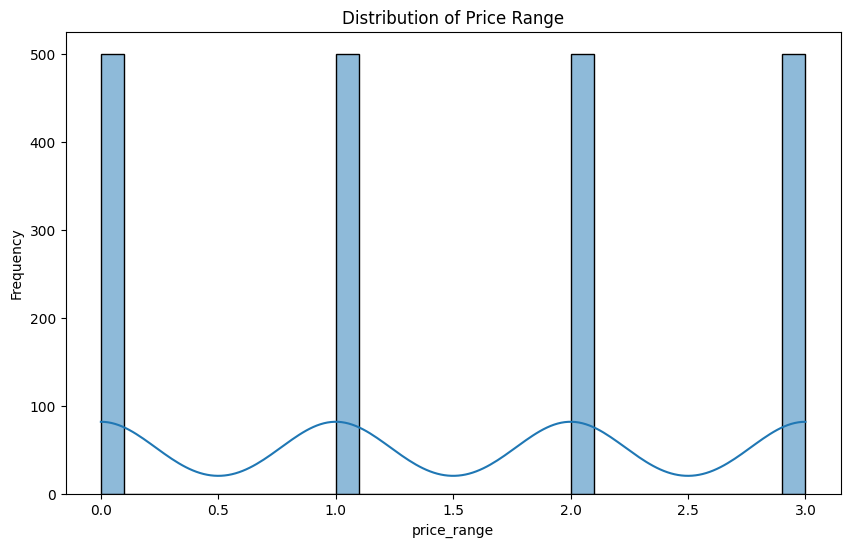

In [7]:
# get histogram for 'price range' for knowing the distribution of it's values


plt.figure(figsize =(10,6))
sns.histplot(df_train['price_range'], bins=30, kde=True)
plt.xlabel('price_range')
plt.ylabel('Frequency')
plt.title('Distribution of Price Range')
plt.show()

**Note for Target variable 'price_range':** There is a uniform distribution of the target variable values, indicating no bias towards a particular category.


[link text](https://)



In [8]:
# Deleting 'fc' and 'three_g' columns from both train and test DataFrames
df_train.drop(columns=['fc', 'three_g','px_height'], inplace=True)
df_test.drop(columns=['fc', 'three_g','px_height'], inplace=True)


# Deleting null values from train and test data
df_train.dropna(inplace=True)
df_test.dropna(inplace=True)


# Training model with algorithm (SVM):

In [10]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

# Split the data into features and target
X = df_train.drop(columns=['price_range'])
y = df_train['price_range']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the scaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create the SVM model
model = SVC(kernel='linear', random_state=42)

# Train the model
model.fit(X_train_scaled, y_train)

# Predict on training data
y_train_pred = model.predict(X_train_scaled)

# Predict on test data
y_test_pred = model.predict(X_test_scaled)

# Classification report for the training data
print("Classification Report for Training Data:")
print(classification_report(y_train, y_train_pred))

# Classification report for the test data
print("Classification Report for Test Data:")
print(classification_report(y_test, y_test_pred))

# Confusion matrix for the training data
print("Confusion Matrix for Training Data:")
print(confusion_matrix(y_train, y_train_pred))

# Confusion matrix for the test data
print("Confusion Matrix for Test Data:")
print(confusion_matrix(y_test, y_test_pred))

# Perform cross-validation
# Apply scaling within the cross-validation using a pipeline
from sklearn.pipeline import make_pipeline
pipeline = make_pipeline(StandardScaler(), SVC(kernel='linear', random_state=42))
scores = cross_val_score(pipeline, X, y, cv=10)

# Print cross-validation scores and their mean
print("Cross-Validation Scores:", scores)
print("Mean Cross-Validation Score:", scores.mean())


Classification Report for Training Data:
              precision    recall  f1-score   support

           0       0.94      0.95      0.94       393
           1       0.89      0.88      0.89       407
           2       0.89      0.88      0.89       392
           3       0.94      0.95      0.95       400

    accuracy                           0.92      1592
   macro avg       0.92      0.92      0.92      1592
weighted avg       0.91      0.92      0.92      1592

Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.96      0.92      0.94       106
           1       0.82      0.90      0.86        89
           2       0.88      0.81      0.84       107
           3       0.89      0.93      0.91        97

    accuracy                           0.89       399
   macro avg       0.89      0.89      0.89       399
weighted avg       0.89      0.89      0.89       399

Confusion Matrix for Training Data:
[[372  21   0   

* **The SVM model** applied to device price range classification achieved robust performance across both training and test datasets. For the ***training data***, it achieved an **overall accuracy of 92% with high precision**, recall, and F1-scores across all price ranges (ranging from 0.89 to 0.95). This indicates that the model effectively learned from the training data and generalized well to unseen examples.

* In terms of ***test data***, the SVM model maintained a strong performance with **an accuracy of 89%**. The precision, recall, and F1-scores for each price range category were also high, demonstrating the model's ability to accurately classify new, previously unseen data.

* Confusion matrices revealed that while the model occasionally misclassified instances, particularly in distinguishing between similar price ranges, overall performance was reliable.

* The purpose of using SVM in this context is to effectively classify devices into price ranges based on their features. SVM is chosen for its ability to handle high-dimensional data and its effectiveness in finding complex decision boundaries, making it suitable for classification tasks where clear margins of separation exist between classes.

In [17]:

import joblib

# Save the model
joblib.dump(model, 'model.pkl')


['model.pkl']

In [ ]:
# !pip install fastapi nest-asyncio pyngrok uvicorn
from fastapi import FastAPI, HTTPException
from pydantic import BaseModel
import joblib
import pandas as pd
import nest_asyncio
from pyngrok import ngrok
import uvicorn

# Apply nest_asyncio to handle event loops in Google Colab
nest_asyncio.apply()

# Load the pre-trained machine learning model (assumed to be saved as 'model.pkl')
model = joblib.load('model.pkl')

# Initialize FastAPI
app = FastAPI()

# Define a Pydantic model for the device data


class Device(BaseModel):
    battery_power: int
    blue: int
    clock_speed: float
    dual_sim: int
    fc:int
    four_g: int
    int_memory: int
    m_dep: float
    mobile_wt: int
    n_cores: int
    pc: int
    px_height: int
    px_width: int
    ram: int
    sc_h: int
    sc_w: int
    talk_time: int
    three_g: int
    touch_screen: int
    wifi: int

# Define a POST endpoint to receive device data and predict price
@app.post("/predict")
async def predict(device: Device):
    # Extract features from the received device data
    features = [
        device.battery_power, device.blue, device.clock_speed,
        device.dual_sim,device.fc, device.four_g, device.int_memory,
        device.m_dep, device.mobile_wt, device.n_cores, device.pc,device.px_height,
        device.px_width, device.ram, device.sc_h, device.sc_w,
        device.talk_time,device.three_g, device.touch_screen, device.wifi
    ]

    # Convert features into a DataFrame for prediction
    features_df = pd.DataFrame([features], columns=[
        'battery_power', 'blue', 'clock_speed', 'dual_sim','fc','four_g', 'int_memory',
        'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height','px_width', 'ram', 'sc_h', 'sc_w',
        'talk_time','three_g' , 'touch_screen', 'wifi'
    ])

    # Deleting 3 feachers which have strong and moderate correlation  with other features

    features_df.drop(columns=['fc', 'three_g','px_height'], inplace=True)



    # Use the loaded model to predict the price range
    prediction = model.predict(features_df)[0]

    # Return the prediction as JSON response
    return {"prediction": int(prediction)}

# Set the authtoken for ngrok
ngrok.set_auth_token("2hs9TttVgOITx136nxeYplEJU0Y_7EWcjYsWwsHmAaGHQWSvt")

# Establish a public URL using ngrok to expose FastAPI endpoint
public_url = ngrok.connect(8000)
print(f"Public URL: {public_url}")

# Run the FastAPI application using uvicorn server
uvicorn.run(app, host="0.0.0.0", port=8000)

INFO:     Started server process [507]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


Public URL: NgrokTunnel: "https://f373-35-245-95-218.ngrok-free.app" -> "http://localhost:8000"
